<div>
<img src="eocgeoservice_logo.png" width="250" align="right"/>
</div>
<div>
<img src="stac.png" width="125" align="right"/>
</div>


# __EOC EO Products Service__ <br> Discovery and Access of Data Using STAC

### EOC EO Products Service
The EOC EO Products Service provides interoperable access to metadata from EO collections and geospatial products of DLR's Earth Observation Center (EOC). As a new web technology and an additional OGC API-based standardized access service, we add a SpatialTemporal Asset Catalog (STAC) to the bouquet of already existing ways to access our data. This provides the user with a more efficient way to discover, visualize and access data.
For more information follow the links:
- [Earth Observation Center](https://www.dlr.de/eoc)
- [EOC EO Products Service](https://geoservice.dlr.de/eoc/ogc/stac/v1/)
- [EOC Geoservice](https://geoservice.dlr.de/web/)

### What is STAC?
STAC (SpatioTemporal Asset Catalog) is a standardized data model for cataloging and exchanging geospatial and temporal data, particularly focused on satellite-based Earth Observation (EO) data.
At its core, the STAC specification provides a common structure for describing and cataloging spatiotemporal assets.
A spatiotemporal asset is any file that represents information about the earth captured in a certain space and time.

__STAC Catalogue__
STAC is a standardized data model for cataloging and exchanging geospatial and temporal data, particularly focused on satellite-based Earth Observation (EO) data. [STAC Catalog Specification](https://github.com/radiantearth/stac-spec/blob/master/catalog-spec/catalog-spec.md)

__STAC Collection__
A STAC Collection provides additional information about a spatio-temporal collection of data. [STAC Collection Specification](https://github.com/radiantearth/stac-spec/blob/master/collection-spec/collection-spec.md)

__STAC Items__
Fundamental to any STAC, a STAC Item represents an atomic collection of inseparable data and metadata. [STAC Item Specification](https://github.com/radiantearth/stac-spec/blob/master/item-spec/item-spec.md)

__STAC Extensions__
While the core specification says nothing about particular types of data, the extensions folder is where one can find domain-specific fields that can be easily added to any STAC Item. [STAC Extensions](https://github.com/radiantearth/stac-spec/tree/master/extensions)

To get more information about each component follow links below:
- [About STAC - The STAC Specification](https://stacspec.org/en/about/stac-spec)
- [STAC on Github](https://github.com/radiantearth/stac-spec)
- [STAC Extensions on GitHub](https://stac-extensions.github.io/)

### Content
In this notebook, we will show how to operate the STAC Catalog, search for specific collections and then query specific items and load them. Therefore, we will first investigate some datasets for Hamburg and subsequently take a look at the Global Snow Cover dataset.

# How to Use Catalog
### Setup

In [1]:
import pystac_client
import odc.stac

import matplotlib.pyplot as plt

import rioxarray

import matplotlib.animation as animation
from IPython.display import HTML

#get Bounding Boxes 
import OSMPythonTools.nominatim as OSMPythonTools_nominatim
import shapely.wkt

Define the Catalog connections. If you want to query a lot of items, you might want to use the timeout parameter. For example:<br>
```DLR_catalog = Client.open(url="https://geoservice.dlr.de/eoc/ogc/stac/v1/", timeout=200)```

In [2]:
DLR_catalog = pystac_client.Client.open(url="https://geoservice.dlr.de/eoc/ogc/stac/v1/") 

### Area of Interest
We define the bounding box of Hamburg by hand.

In [3]:
bbox = (9.65, 53.3951118, 10.3252805, 53.75) # Hamburg, Germany
x_min, y_min, x_max, y_max = bbox
ratio = (x_max - x_min) / (y_max - y_min)

### Discover Catalog
Get some general information about the DLR Catalog.

In [4]:
print(f"ID: {DLR_catalog.id}")
print(f"Title: {DLR_catalog.title}")
print(f"Description: {DLR_catalog.description}")

ID: GeoserverSTACLandingPage
Title: EOC EO Products Service
Description: *BETA* Provides interoperable access to metadata from EO collections and products of DLR's Earth Observation Center (EOC). *BETA*


### Discover Collections
_"A STAC collection provides additional information about a spatio-temporal collection of data. It extends Catalog directly, layering on additional fields to enable description of things like the spatial and temporal extent of the data, the license, keywords, providers, etc. It in turn can easily be extended for additional collection level metadata. It is used standalone by parts of the STAC community, as a lightweight way to describe data holdings."_ [(STAC Spec)](https://stacspec.org/en/about/stac-spec/)

First we query the catalogue for the number of available collections.

In [5]:
collections = list(DLR_catalog.get_collections())
print(f"Number of collections: {len(collections)}")

Number of collections: 44


Here we receive a tabular overview of all collections available in the Catalog. The IDs and the corresponding titles are listed. The ID of the respective collection is used to obtain further information on the collection.

In [6]:
print("Collection IDs | Collection Title")
print("---------------------------------")

for collection in collections:
    print(f"{collection.id} | {collection.title}")

Collection IDs | Collection Title
---------------------------------
S5P_TROPOMI_L4_P1D_NO2surf | S5P Tropomi L4 P1D NO2surf
ENMAP_HSI_L0_QL | EnMAP L0 HSI Quicklook Products
ENMAP_HSI_L2A | EnMAP L2A HSI Products
D4H | Sentinel-1 Floodmasks (Data4Human)
S2_L2A_MAJA | Sentinel-2 L2A MAJA Products
S2_L3A_WASP | Sentinel-2 L3A Monthly WASP Products
IOER_BUILDINGS_COMP_GER_1M | IOER Building Footprints - Complete - Germany, 1m
IOER_BUILDINGS_NONRES_GER_1M | IOER Building Footprints - non-residential - Germany, 1m
IOER_STRUCTURE_HEIGHT_GER_100M | IOER Building Structure - Height Median - Germany, 100m
IOER_STRUCTURE_VOLUME_GER_100M | IOER Building Structure - Volume - Germany, 100m
IOER_SURFACECOV_COMP_GER_10M | IOER Surface Coverage - complete - Germany, 10m
IOER_SURFACECOV_NONRES_GER_10M | IOER Surface Coverage - non-residential - Germany, 10m
WSF_2015 | World Settlement Footprint (WSF) 2015 v2
WSF_2019 | World Settlement Footprint (WSF) 2019
CROPTYPES_GERMANY_P1Y | CropTypes - Crop Type 

### Discover Items
_"Fundamental to any STAC, a STAC Item represents an atomic collection of inseparable data and metadata. A STAC Item is a GeoJSON feature and can be easily read by any modern GIS or geospatial library. The STAC Item JSON specification includes additional fields for the time the asset represents, a thumbnail for quick browsing, asset links, links to the described data and relationship links, allowing users to traverse other related STAC Items."_ [(STAC Spec)](https://stacspec.org/en/about/stac-spec/)

In this example, we query the number of items for the World Settlement Footprint 2019 dataset with the bounding box for Hamburg. The loading time depends on the number of items. If you use a collection with a lot of items, you can use the timeout parameter, as described above, to avoid a timeout of the query.

In [7]:
search = DLR_catalog.search(collections=["WSF_2019"], bbox=bbox)
items = list(search.items())
print(f"Search returned {len(items)} items")

Search returned 2 items


We only get two items for this  bounding box. We can take a closer look at the items we received.

In [8]:
items[0]

<Item id=WSF2019_v1_10_52>

In [9]:
for item in items:
    print(f"- {item.id}")

- WSF2019_v1_10_52
- WSF2019_v1_8_52


# Analysis 1 - Hamburg
### Load World Settlement Footprint Data into ```xarray.Dataset```
To use the data, we want to load the found items into an ```xarray.Dataset```. This can be done with the ```load``` function of ```odc.stac``` library.

In [10]:
wsf_original = odc.stac.load(items,
               groupby="time",
               chunk={},
               bbox=bbox,
               resolution=0.0009)

wsf_original.head()

<xarray.Dataset> Size: 117B
Dimensions:      (latitude: 5, longitude: 5, time: 1)
Coordinates:
  * latitude     (latitude) float64 40B 53.75 53.75 53.75 53.75 53.75
  * longitude    (longitude) float64 40B 9.65 9.651 9.652 9.653 9.654
    spatial_ref  int32 4B 4326
  * time         (time) datetime64[ns] 8B 2019-07-02T11:59:59
Data variables:
    wsf2019      (time, latitude, longitude) uint8 25B 0 0 0 255 ... 0 255 255 0

Now, we can take a first look at the data by plotting the data variable ```wsf2019```.

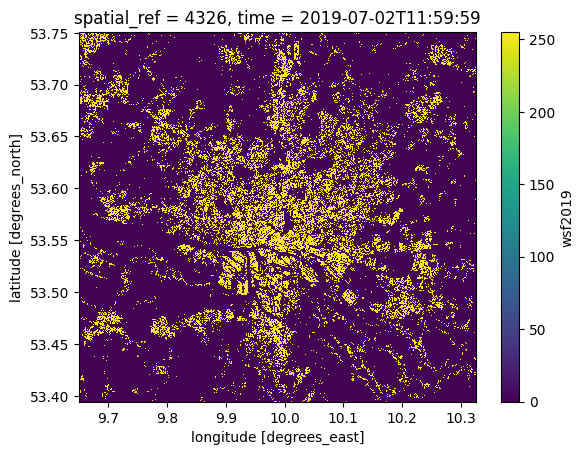

In [11]:
wsf_original.wsf2019.plot()

If you want, you can easily save your area of interest as a tif using ```rioxarray```. To get a 2D dataset which can be saved as tif we need to discard the time coordinate.

In [12]:
wsf_original.isel(time=0).rio.to_raster("Hamburg_wsf.tif")

### Load and Coarsen Forest Structure Data 
We can load other data in the same way. So let's take a look at the Forest Structure collection. Unlike the World Settlement Footprint collection, this collection contains items of the same region covering different times. Therefore, we can also use the ```datetime``` to filter items.

To make the processing faster for this tutorial, we will coarsen the data a bit.

In [13]:
search_agbd = DLR_catalog.search(collections=["FOREST_STRUCTURE_DE_AGBD_P1Y"], bbox=bbox, datetime='2017-01-01')
items_agbd = list(search_agbd.items())
agbd_2017_original=odc.stac.load(items_agbd,
               groupby="time",
               chunk={},
               bbox=bbox)

agbd_2017_low = agbd_2017_original.coarsen(longitude=3).mean().coarsen(latitude=2).mean()
agbd_2017_low.head()

<xarray.Dataset> Size: 292B
Dimensions:      (time: 1, latitude: 5, longitude: 5)
Coordinates:
  * latitude     (latitude) float64 40B 53.75 53.75 53.75 53.75 53.75
  * longitude    (longitude) float64 40B 9.65 9.65 9.651 9.651 9.651
    spatial_ref  int32 4B 4326
  * time         (time) datetime64[ns] 8B 2017-01-01
Data variables:
    agbd_cog     (time, latitude, longitude) float64 200B -9.999e+03 ... -9.9...

### Load Global Water Pack
Now, let's do the same for Global Water Pack collection. Here you can see that the ```datetime``` can be given with different accuracy.

In [14]:
search_gwp = DLR_catalog.search(collections=["GWP_P1Y"], bbox=bbox, datetime='2022')
items_gwp = list(search_gwp.items())
gwp_original = odc.stac.load(items_gwp,
               groupby="time",
               chunk={},
               bbox=bbox)
gwp_original.head()

<xarray.Dataset> Size: 167B
Dimensions:      (latitude: 5, longitude: 5, time: 1)
Coordinates:
  * latitude     (latitude) float64 40B 53.75 53.75 53.74 53.74 53.74
  * longitude    (longitude) float64 40B 9.651 9.653 9.655 9.657 9.659
    spatial_ref  int32 4B 4326
  * time         (time) datetime64[ns] 8B 2022-01-01
Data variables:
    gwpp1y       (time, latitude, longitude) uint16 50B 0 0 0 0 0 ... 0 0 0 0 0
    gwpp1y_rel   (time, latitude, longitude) uint8 25B 101 101 101 ... 101 101

### Modify, Plot and Save Data
We finally loaded the three datasets we are interested in. Now, we need to make them transparent to plot them in one plot. This can be done by only keeping the values above zero, as shown in the next cell.

In [15]:
agbd_2017_transparent = agbd_2017_low.where(agbd_2017_low.agbd_cog>0)
wsf_transparent = wsf_original.where(wsf_original.wsf2019>0)

We can also save a modified dataset as tif.

In [16]:
agbd_2017_transparent.isel(time=0).rio.to_raster("Hamburg_agbd.tif")

We can plot the data and with ```matplotlib.pyplot``` also save the plot as image.

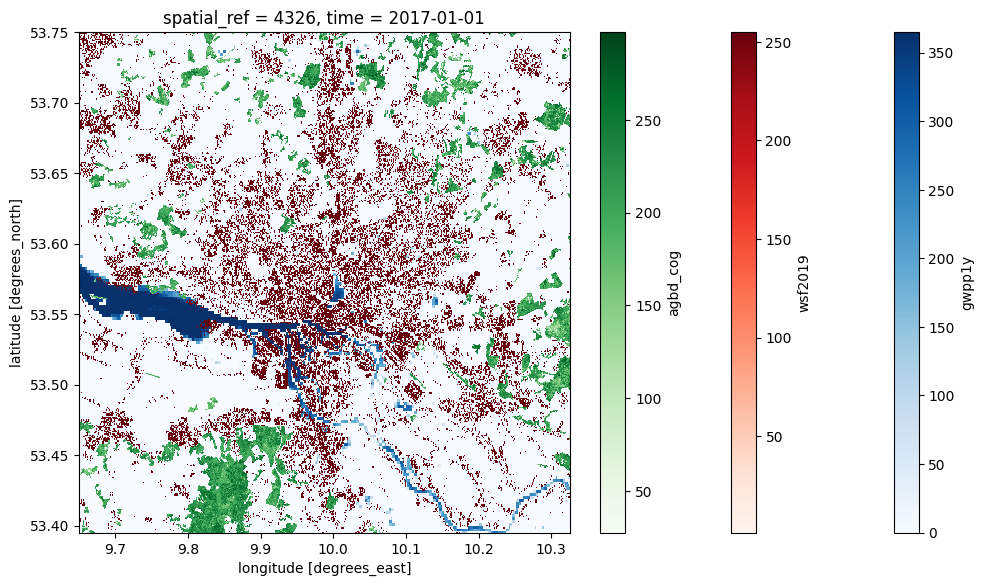

In [17]:
gwp_original.gwpp1y.plot(aspect=ratio, size=6.5, cmap='Blues')
wsf_transparent.wsf2019.plot(cmap='Reds')
agbd_2017_transparent.agbd_cog.plot(cmap='Greens')

# save
plt.savefig('Hamburg.png')

### Use Other Queryables
Extensions can help to describe data completely. In the following example, we are looking for scenes from the Sentinel-2 MAJA Collection for the Munich area with cloud cover below 20% and snow cover above 50% for the year 2023.

In [18]:
S2_MAJA = ["S2_L2A_MAJA"]
bbox = [11.089325,47.893787,11.923599,48.329322]
datetime = ["2023-01-01", "2023-12-31"]
properties = "eo:cloud_cover<20 AND eo:snow_cover>50"

In [19]:
s2maja_items = DLR_catalog.search(
    collections=S2_MAJA, 
    datetime=datetime,
    bbox=bbox,
    filter=properties,
    max_items=1000
).item_collection()
s2maja_items

# Analysis 2 - Change of Snow Cover Duration in the Alps
In this second part, we can take a closer look at the Global Snow Pack collection. Therefore, we will use the bounding box enclosing the alps.
### Area of Interest
We specify the bounding box using ```OSMPythonTools```.

In [20]:
nominatim = OSMPythonTools_nominatim.Nominatim()

region = nominatim.query('Alps', wkt=True)
#get boundingbox of first search result
bbox = shapely.wkt.loads(region.wkt()).bounds
x_min, y_min, x_max, y_max = bbox
ratio = (x_max - x_min) / (y_max - y_min)
bbox

(5.045574, 43.4077305, 16.6058353, 48.4092924)

### Query and Load the Data
We can do this in the same manner demonstrated before.

In [21]:
search_2001 = DLR_catalog.search(collections=["GSP_SCD_P1Y"], bbox=bbox, datetime='2001-07-01')
item_2001 = list(search_2001.items())
search_2023 = DLR_catalog.search(collections=["GSP_SCD_P1Y"], bbox=bbox, datetime='2023-07-01')
item_2023 = list(search_2023.items())

In [22]:
gsp_2001 = odc.stac.load(item_2001, groupby="time", chunk={}, bbox=bbox)
gsp_2023 = odc.stac.load(item_2023, groupby="time", chunk={}, bbox=bbox)

### Investigate Change of SCD 
To visualize the change we can substract the data of 2001 from the data of 2023.

In [23]:
scd_compare = gsp_2023.drop_vars('time') - gsp_2001.drop_vars('time')
scd_compare.isel(time=0).rio.to_raster("SCD_Alps_2001-2023.tif")

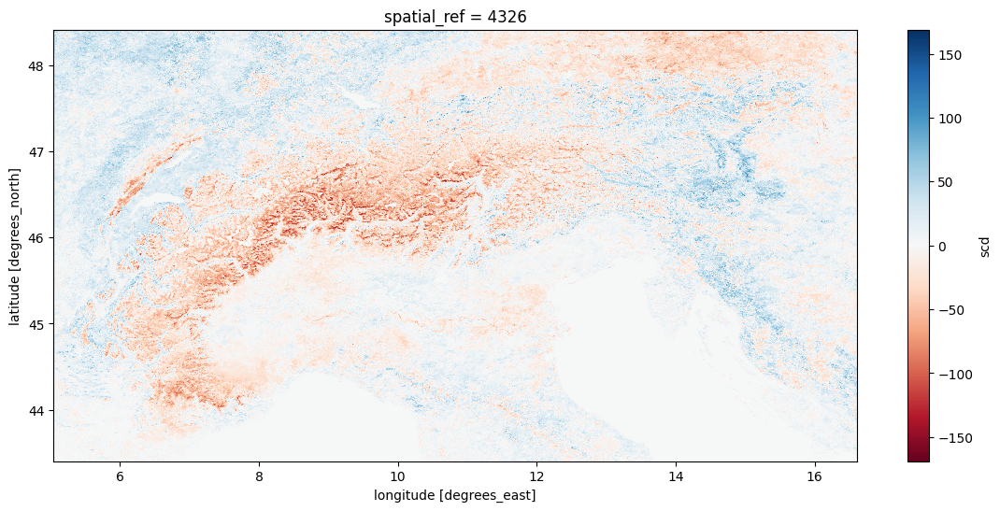

In [24]:
scd_compare.scd.plot(aspect=ratio, size=6, cmap='RdBu')

### Generate a Gif
Create and save a gif using ```matplotlib.animation```.

In [25]:
search_gsp = DLR_catalog.search(collections=["GSP_SCD_P1Y"], bbox=bbox)
item_gsp = list(search_gsp.items())
gsp = odc.stac.load(item_gsp, groupby="time", chunk={}, bbox=bbox)

In [26]:
fig, ax = plt.subplots(figsize=(10, 5))
image = gsp.scd[0].plot(cmap='Blues', cbar_kwargs={'extend':'neither'})

ax.set_title("Time = " + str(gsp.coords['time'].values[0])[:10])


def plot_timestep(t):
    image.set_array(gsp.scd[t,:,:].values.flatten())
    ax.set_title("Time = " + str(gsp.coords['time'].values[t])[:10])
    return image
# Run the animation, applying `update()` for each of the times in the variable
animation_gsp = animation.FuncAnimation(fig, plot_timestep, frames=range(23), blit=False, interval=300)

# Save to file or display on screen
animation_gsp.save("gsp_alps_matplotlib.gif")
plt.close()
HTML(animation_gsp.to_jshtml())

MovieWriter ffmpeg unavailable; using Pillow instead.


### Investigate Change at the Aletsch Glacier
To focus on the Aletsch glacier we need to query and load the data of this smaller bounding box and again substract one dataset from the other.

In [27]:
bbox_glacier = (7.961998,46.392411,8.110313,46.523910)
search_glacier_2001 = DLR_catalog.search(collections=["GSP_SCD_P1Y"], bbox=bbox_glacier, datetime='2001-07-01')
item_glacier_2001 =list(search_glacier_2001.items())
search_glacier_2023 = DLR_catalog.search(collections=["GSP_SCD_P1Y"], bbox=bbox_glacier, datetime='2023-07-01')
item_glacier_2023 =list(search_glacier_2023.items())
gsp_2001_glacier = odc.stac.load(item_glacier_2001, groupby="time", chunk={}, bbox=bbox_glacier)
gsp_2023_glacier = odc.stac.load(item_glacier_2023, groupby="time", chunk={}, bbox=bbox_glacier)

In [28]:
scd_compare_glacier = gsp_2023_glacier.drop_vars('time') - gsp_2001_glacier.drop_vars('time')

### Histogram
To see the statistics we can use a histogram and plot the different years, their means and the comparison data.

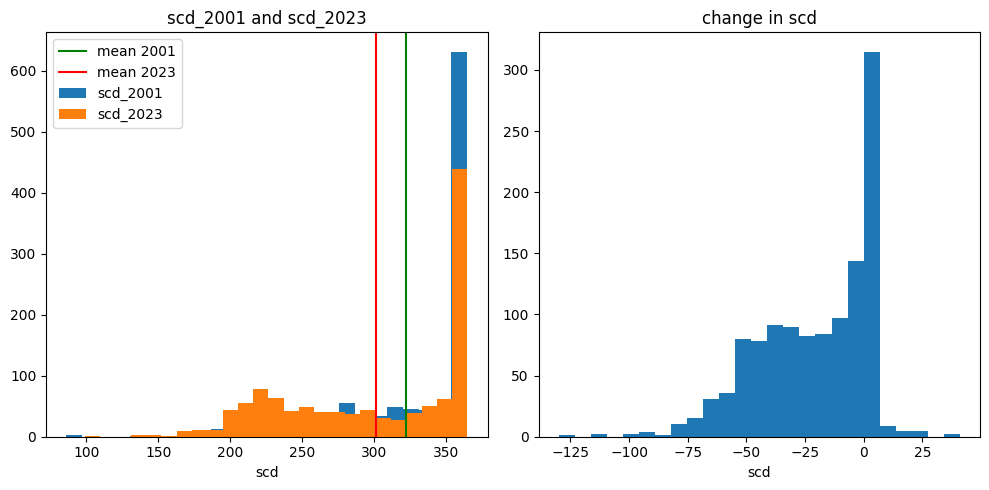

In [29]:
# number of bins we want to plot
bins = 25
labels = ["mean 2001", "mean 2023", "scd_2001", "scd_2023"]
mean_2001 = gsp_2001_glacier.scd.mean()
mean_2023 = gsp_2023_glacier.scd.mean()

fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

gsp_2001_glacier.scd.plot.hist(ax=axs[0], bins=bins)
gsp_2023_glacier.scd.plot.hist(ax=axs[0], bins=bins)
axs[0].axvline(x=mean_2001, color='green')
axs[0].axvline(x=mean_2023, color='red')
axs[0].legend(labels)

axs[0].legend(labels)
axs[0].set_title('scd_2001 and scd_2023')
scd_compare_glacier.scd.plot.hist(ax=axs[1], bins=bins)
axs[1].set_title('change in scd')

plt.tight_layout()
plt.show()